# Verification that the rbf actually corrects a perturbed contour

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [5]:
import numpy as np
import logging
import sys
from pathlib import Path
import torch
from IPython.display import display

import matplotlib.pyplot as plt
import diffmeshopt.opt2d.hyperparameter_search as hps
from diffmeshopt.opt2d.hyperparameter_search import ExperimentRunner
import diffmeshopt.opt2d.evaluation as evaluation
from diffmeshopt.opt2d import vis
from pprint import pprint
import diffmeshopt.opt2d.debug as debug
import diffmeshopt.opt2d.trainer as trainer_module


debug.DEBUG = True

# Configure logging to stdout
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    handlers=[logging.StreamHandler(sys.stdout)],
)

In [6]:
# Define paths
dataset_path = "../data/2d_training_data_perturbations.pkl"  # Adjust if needed
output_dir = "../output/verification_test_5A/rbf/"
device = "cuda" if torch.cuda.is_available() else "cpu"

print(f"Using device: {device}")

Using device: cpu


In [7]:
def create_trainer_with_config(props_dict: dict, output_subdir_name: str):
    # Initialize Runner
    runner = ExperimentRunner(dataset_path, output_dir, device=device)

    refiner_props, template_props, t_mode = runner._build_props(props_dict)
    print("Default params:")
    pprint(refiner_props)

    init_contour = runner.dataset["shrink_5_perturb_3"]["contour"]
    image = runner.dataset["shrink_5_perturb_3"]["image"]

    # Calculating the contour before perturbation to use as ground truth for evaluation
    # Since the image for perturbed contour starts at a different row and column,
    # we need to adjust the contour coordinates accordingly
    unperturb_contour = runner.dataset["original"]["contour"]
    gt_contour = unperturb_contour.copy()  # Assuming the ground truth is the unperturbed contour
    gt_contour[:, 0] += (
        runner.dataset["original"]["row_start"] - runner.dataset["shrink_5_perturb_3"]["row_start"]
    )
    gt_contour[:, 1] += (
        runner.dataset["original"]["col_start"] - runner.dataset["shrink_5_perturb_3"]["col_start"]
    )

    # Prepare Tensors
    image_t = torch.from_numpy(image).float().to(runner.device)
    contour_t = torch.from_numpy(init_contour).float().to(runner.device)
    gt_contour_t = torch.from_numpy(gt_contour).float().to(runner.device)

    print("Computing contour metrics between ground truth and initial contour...")
    pprint(evaluation.compute_contour_metrics(gt_contour_t, contour_t))

    template_model = hps.TemplateModelFactory.create(
        t_mode,
        template_props,
        num_vertices=len(init_contour),
        image_shape=image.shape,
    ).to(runner.device)

    # run_dir = runner.output_dir / "cp_40_no_regs"
    run_dir = runner.output_dir / output_subdir_name
    refiner = hps.RBFContourRefiner(
        contour_t,
        refiner_props,
        template_model,
    )
    refiner.to(runner.device)

    config = hps.TrainerConfig(
        output_dir=run_dir,
        image=image,
        gt_contour=gt_contour,
        max_steps=50000,
        save_interval=2000,  # Only save at end
        log_interval=100,
        use_tensorboard=False,  # Disable TB to save IO
        save_images=True,
        enable_progress_bar=True,  # Disable progress bar for parallel runs
    )

    trainer = hps.OptimizationTrainer(refiner, config)
    return (
        trainer,
        run_dir,
        refiner_props,
        template_props,
        t_mode,
        image,
        init_contour,
        gt_contour,
        image_t,
        contour_t,
        gt_contour_t,
    )

### Result: 40 control points with shape smoothing but no other regularization

Seems to work ok? But not perfect --- the lower left corner has area where the fit is not working. Check results from two random seeds

In [8]:
generator = debug.get_generator(device=device, manual_seed=1234)

2026-07-22 14:38:26,012 - INFO - Creating new generator with seed 1234 on device cpu.


In [9]:
### First test is without the tangential and normal laplacian
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "rbf",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0.0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.1,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-2,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 30,
    "rbf_sigma": 0.0,
}


In [10]:
(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="basic")

2026-07-22 14:38:27,316 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-22 14:38:27,317 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'rbf_sigma', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-22 14:38:27,318 - INFO - Unused params: []
2026-07-22 14:38:27,321 - INFO - Creating template model: bspline
2026-07-22 14:38:27,321 - INFO - Initializing ContourLoss
2026-07-22 14:38:27,323 - INFO - Auto-configured RBF sigma: 58.14 (avg spacing: 29.07)
/Users/saugat/code/diffmeshopt/diffmeshopt/opt2d/refiner.py:872: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("sigma", torch.tensor(sigma))
2026-07-22 1

Default params:
RBFContourRefinerProps(num_steps=2000,
                       learning_rate=0.01,
                       data_loss_type=<DataLossType.BIGAUSSIAN_CORRELATION: 'bigaussian_correlation'>,
                       initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                       'anchor_sigma_ratio': 0.0,
                                                       'contour_anchor': 0.0,
                                                       'contour_laplacian': 0.0,
                                                       'edge_length': 0.0,
                                                       'normal_consistency': 0.0,
                                                       'smooth_amp_ratio': 0.1,
                                                       'smooth_peak_dist': 0.1,
                                                       'smooth_sigma': 0.1,
                                                       'smooth_sigma_ratio': 0.1,
   

In [11]:
pprint(refiner_props.profile_width)

5


In [12]:
refiner = trainer.refiner

cp_dists = torch.cdist(refiner.control_points, refiner.control_points)
# Add large value to diagonal to ignore self-distance
eye = torch.eye(len(refiner.rbf_weights), device=cp_dists.device)
cp_dists = cp_dists + eye * 1e9
# Nearest neighbor distance
nn_dist = cp_dists.min(dim=1).values.mean()
nn_dist

tensor(29.0724)

In [13]:
# 1. Print weights before step
print("Before step weight sum:", refiner.rbf_weights.norm().sum().item())

# 2. Run one step
losses = refiner.step(image_t)

# 3. Check if the weight parameter itself changed
print("After step weight sum: ", refiner.rbf_weights.norm().sum().item())
print("Weights Grad vector norm:", refiner.rbf_weights.grad.norm().item())

Before step weight sum: 0.0
After step weight sum:  0.07745695859193802
Weights Grad vector norm: 0.010186168365180492


In [14]:
trainer.fit(50000)
print(trainer.refiner.rbf_weights)
trainer.refiner.compute_losses(trainer.model.image_ref)

2026-07-22 14:38:29,953 - INFO - Starting fit for 50000 steps.
/Users/saugat/code/diffmeshopt/.venv/lib/python3.14/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /Users/saugat/code/diffmeshopt/output/verification_test_5A/rbf/basic/2026-07-22_14-38-27 exists and is not empty.
/Users/saugat/code/diffmeshopt/.venv/lib/python3.14/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Epoch 0: 100%|#| 50000/50000 [04:31<00:00, 183.99it/s, v_num=1.0, total_loss=0.5

`Trainer.fit` stopped: `max_steps=50000` reached.


2026-07-22 14:43:01,854 - INFO - Final state saved to ../output/verification_test_5A/rbf/basic/2026-07-22_14-38-27/final.pkl


Parameter containing:
tensor([[ 2.7409,  0.5728],
        [ 5.3629, -0.9102],
        [ 8.3844, -2.4561],
        [ 9.2087, -1.8837],
        [ 6.8121,  0.1579],
        [ 3.1230,  1.2258],
        [ 0.4384,  0.1767],
        [-0.9954, -2.0742],
        [-2.5882, -3.6459],
        [-4.2340, -3.9995],
        [-5.2393, -3.8864],
        [-4.8580, -3.3075],
        [-3.4526, -2.7566],
        [-1.6225, -2.0312],
        [-0.5234, -1.2920],
        [-0.9459,  0.1707],
        [-2.7122,  1.2737],
        [-4.0051,  1.2603],
        [-3.4044,  0.3064],
        [-1.3517, -0.5790],
        [ 0.4905, -0.4453],
        [ 0.8717,  1.2930],
        [ 0.7270,  2.8297],
        [ 0.1929,  2.6625],
        [-1.4054,  1.0903],
        [-3.2805, -1.0869],
        [-3.2870, -2.3529],
        [-1.5612, -2.0394],
        [ 0.9004, -0.3289],
        [ 2.7409,  0.5728]], requires_grad=True)


{'data_loss': tensor(0.5692, grad_fn=<AddBackward0>),
 'correlation_loss': tensor(0.5095, grad_fn=<DivBackward0>),
 'shape_loss': tensor(0.0597, grad_fn=<MulBackward0>),
 'contour_laplacian_loss': tensor(0., grad_fn=<MulBackward0>),
 'edge_length_loss': tensor(0., grad_fn=<MulBackward0>),
 'tangential_laplacian_loss': tensor(0.),
 'normal_consistency_loss': tensor(0.),
 'contour_anchor_loss': tensor(0.),
 'anchor_sigma_loss': tensor(0., grad_fn=<MulBackward0>),
 'anchor_peak_dist_loss': tensor(0., grad_fn=<MulBackward0>),
 'anchor_sigma_ratio_loss': tensor(0.),
 'anchor_amp_ratio_loss': tensor(0.),
 'smooth_sigma_loss': tensor(0.0009, grad_fn=<MulBackward0>),
 'smooth_peak_dist_loss': tensor(6.1230e-10, grad_fn=<MulBackward0>),
 'smooth_sigma_ratio_loss': tensor(0.),
 'smooth_amp_ratio_loss': tensor(0.),
 'rbf_weight_decay_loss': tensor(0.0089, grad_fn=<MulBackward0>),
 'total_loss': tensor(0.5790, grad_fn=<AddBackward0>)}

In [15]:
# 1. Print weights before step
print("Before step weight sum:", refiner.rbf_weights.norm().sum().item())

# 2. Run one step
losses = refiner.step(image_t)
pprint({k: v for k, v in refiner.compute_losses(image_t).items() if v != 0})


# 3. Check if the weight parameter itself changed
print("After step weight sum: ", refiner.rbf_weights.norm().sum().item())
print("Weights Grad vector norm:", refiner.rbf_weights.grad.norm().sum().item())

Before step weight sum: 23.048917770385742
{'correlation_loss': tensor(0.5050, grad_fn=<DivBackward0>),
 'data_loss': tensor(0.5650, grad_fn=<AddBackward0>),
 'rbf_weight_decay_loss': tensor(0.0089, grad_fn=<MulBackward0>),
 'shape_loss': tensor(0.0600, grad_fn=<MulBackward0>),
 'smooth_peak_dist_loss': tensor(8.8990e-06, grad_fn=<MulBackward0>),
 'smooth_sigma_loss': tensor(0.0009, grad_fn=<MulBackward0>),
 'total_loss': tensor(0.5749, grad_fn=<AddBackward0>)}
After step weight sum:  23.073204040527344
Weights Grad vector norm: 0.0025048349052667618


In [16]:
# Temporary Diagnostic inside your training loop:
refiner.rbf_weights.grad.zero_()
# Backprop ONLY the data-driven parts

losses = refiner.forward_pass(image_t)
(losses["data_loss"] + losses["shape_loss"]).backward(retain_graph=True)
print("DATA ONLY Grad Norm:", refiner.rbf_weights.grad.norm().item())

refiner.rbf_weights.grad.zero_()
# Backprop ONLY the regularizer
losses["rbf_weight_decay_loss"].backward()
print("DECAY ONLY Grad Norm:", refiner.rbf_weights.grad.norm().item())

DATA ONLY Grad Norm: 0.0029645180329680443
DECAY ONLY Grad Norm: 0.0007691068458370864


In [17]:
trainer.refiner.compute_losses(image_t)

{'data_loss': tensor(0.5585, grad_fn=<AddBackward0>),
 'correlation_loss': tensor(0.4993, grad_fn=<DivBackward0>),
 'shape_loss': tensor(0.0592, grad_fn=<MulBackward0>),
 'contour_laplacian_loss': tensor(0., grad_fn=<MulBackward0>),
 'edge_length_loss': tensor(0., grad_fn=<MulBackward0>),
 'tangential_laplacian_loss': tensor(0.),
 'normal_consistency_loss': tensor(0.),
 'contour_anchor_loss': tensor(0.),
 'anchor_sigma_loss': tensor(0., grad_fn=<MulBackward0>),
 'anchor_peak_dist_loss': tensor(0., grad_fn=<MulBackward0>),
 'anchor_sigma_ratio_loss': tensor(0.),
 'anchor_amp_ratio_loss': tensor(0.),
 'smooth_sigma_loss': tensor(0.0009, grad_fn=<MulBackward0>),
 'smooth_peak_dist_loss': tensor(8.8990e-06, grad_fn=<MulBackward0>),
 'smooth_sigma_ratio_loss': tensor(0.),
 'smooth_amp_ratio_loss': tensor(0.),
 'rbf_weight_decay_loss': tensor(0.0089, grad_fn=<MulBackward0>),
 'total_loss': tensor(0.5683, grad_fn=<AddBackward0>)}

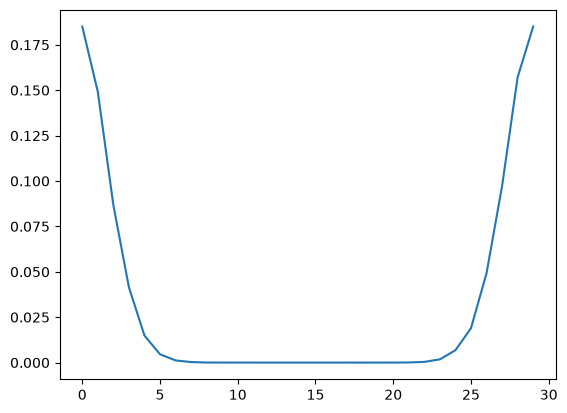

In [18]:
plt.plot(trainer.refiner.kernel_matrix.detach().cpu().numpy()[0])

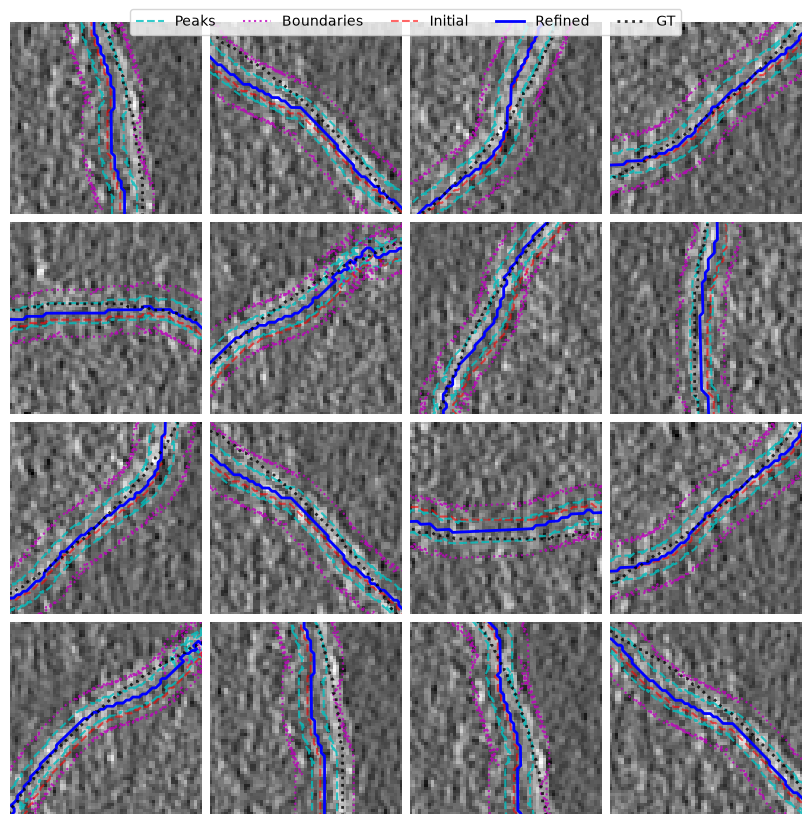

In [19]:
trainer.plot_image()

In [20]:
trainer.trainer.logger.history[-1]

{'step': 49999,
 'data_loss': 0.5589460134506226,
 'correlation_loss': 0.4991282820701599,
 'shape_loss': 0.05981772765517235,
 'contour_laplacian_loss': 0.0,
 'edge_length_loss': 0.0,
 'tangential_laplacian_loss': 0.0,
 'normal_consistency_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'anchor_amp_ratio_loss': 0.0,
 'smooth_sigma_loss': 0.0009391228668391705,
 'smooth_peak_dist_loss': 2.6547999354420426e-09,
 'smooth_sigma_ratio_loss': 0.0,
 'smooth_amp_ratio_loss': 0.0,
 'rbf_weight_decay_loss': 0.008848752826452255,
 'total_loss': 0.5687338709831238,
 'mean_dist': 2.541943311691284,
 'epoch': 0}

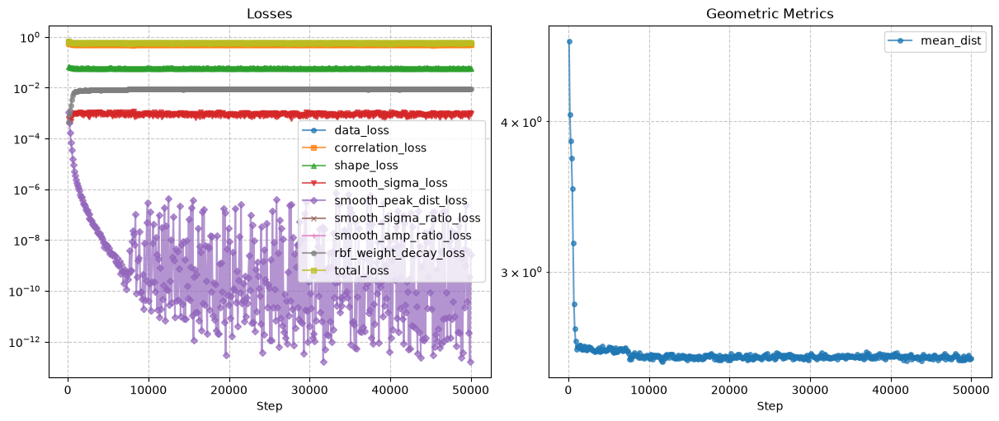

In [21]:
trainer.plot_metrics()

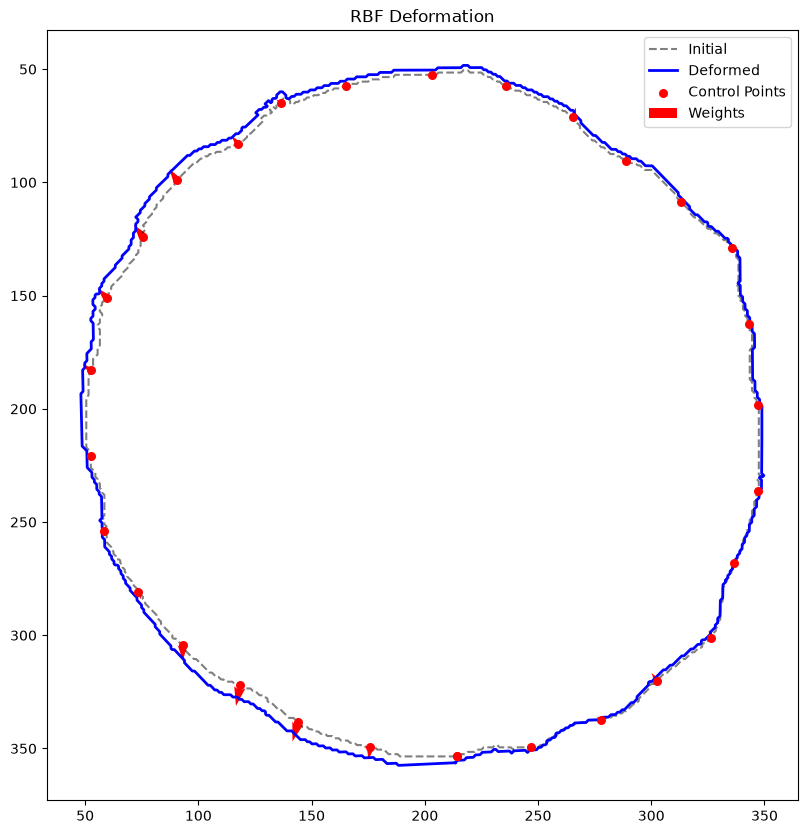

In [22]:
trainer.refiner.visualize_rbf_field()

In [102]:
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]

In [103]:
chamfer_from_init

2.4966788291931152

In [104]:
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)


(tensor(6.3407, grad_fn=<MeanBackward0>),
 tensor(0.1976, grad_fn=<StdBackward0>),
 tensor(2.1136, grad_fn=<MeanBackward0>),
 tensor(0.0659, grad_fn=<StdBackward0>))

Mean Peak Dist: 6.34, Mean Sigma1: 2.11, Mean Sigma2: 2.11
Original Peak Dist: 4.0 Original Sigma1: 0.75


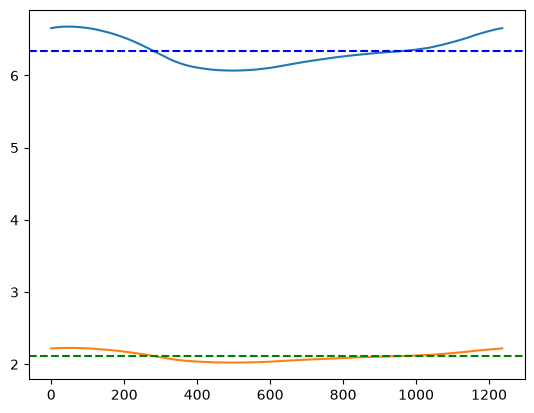

In [105]:
mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()

THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporarily using L2 norm for averaging template profiles for visualization.
THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporary setting for profile norm calculations. Not sure how it works with L1 vs L2.


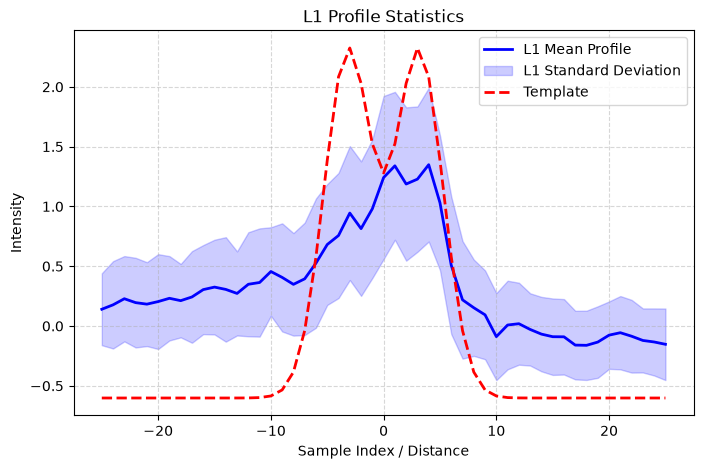

In [106]:
trainer.refiner.visualize_profile_statistics(image_t.cpu())


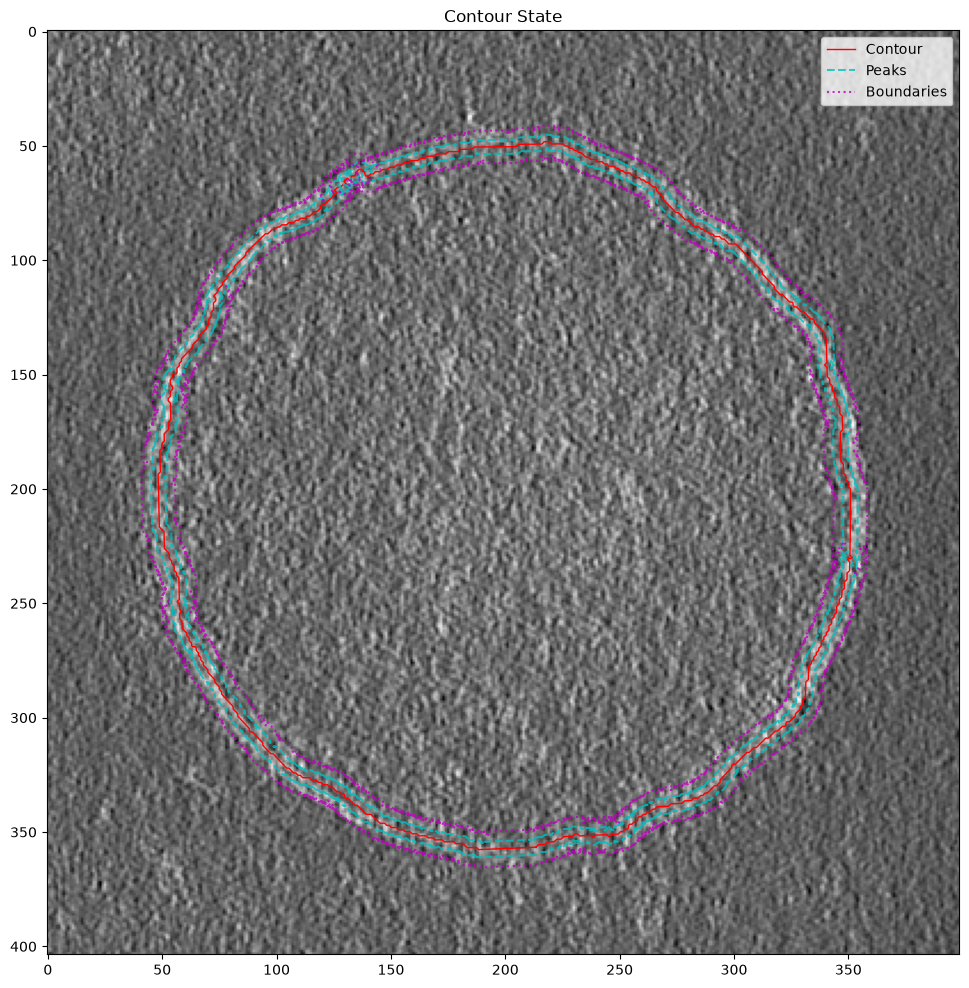

In [107]:
trainer.refiner.visualize_contour(image_t.detach())

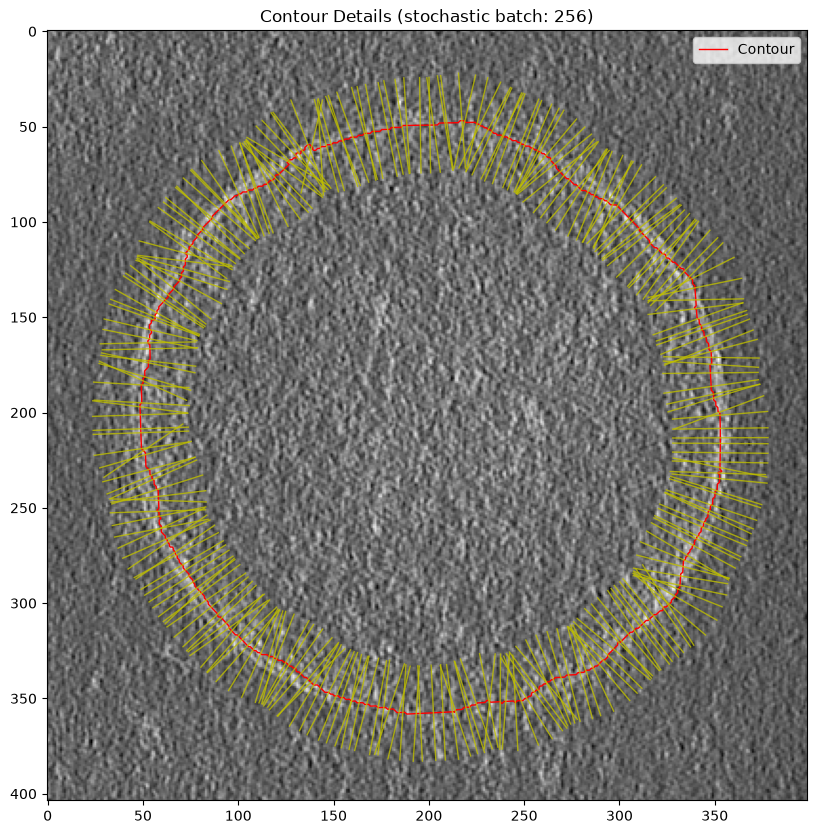

In [67]:
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())

#### Next random seed

2026-07-20 16:51:08,858 - INFO - Resetting generator.
2026-07-20 16:51:08,860 - INFO - Creating new generator with seed 145 on device cpu.
2026-07-20 16:51:08,861 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-20 16:51:08,863 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'rbf_sigma', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-20 16:51:08,864 - INFO - Unused params: []
2026-07-20 16:51:08,866 - INFO - Creating template model: bspline
2026-07-20 16:51:08,867 - INFO - Initializing ContourLoss
2026-07-20 16:51:08,869 - INFO - Auto-configured RBF sigma: 44.23 (avg spacing: 22.11)
2026-07-20 16:51:08,871 - INFO - Auto-configured RBF weight decay: 0.1333 (target_disp=5.0px, sigma=0.75)
2026-07-20 16:51:08,872 - INFO - Output directory set to: ../output/verification_

Default params:
RBFContourRefinerProps(num_steps=2000,
                       learning_rate=0.5,
                       initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                       'anchor_sigma_ratio': 0.0,
                                                       'contour_anchor': 0.0,
                                                       'contour_laplacian': 0.0,
                                                       'edge_length': 0.0,
                                                       'normal_consistency': 0.0,
                                                       'smooth_amp_ratio': 0.1,
                                                       'smooth_peak_dist': 0.1,
                                                       'smooth_sigma': 0.1,
                                                       'smooth_sigma_ratio': 0.1,
                                                       'tangential_laplacian': 0},
                       p

2026-07-20 16:51:19,766 - INFO - Final state saved to ../output/verification_test_5A/rbf/cp_40_no_regs_2/2026-07-20_16-51-08/final.pkl


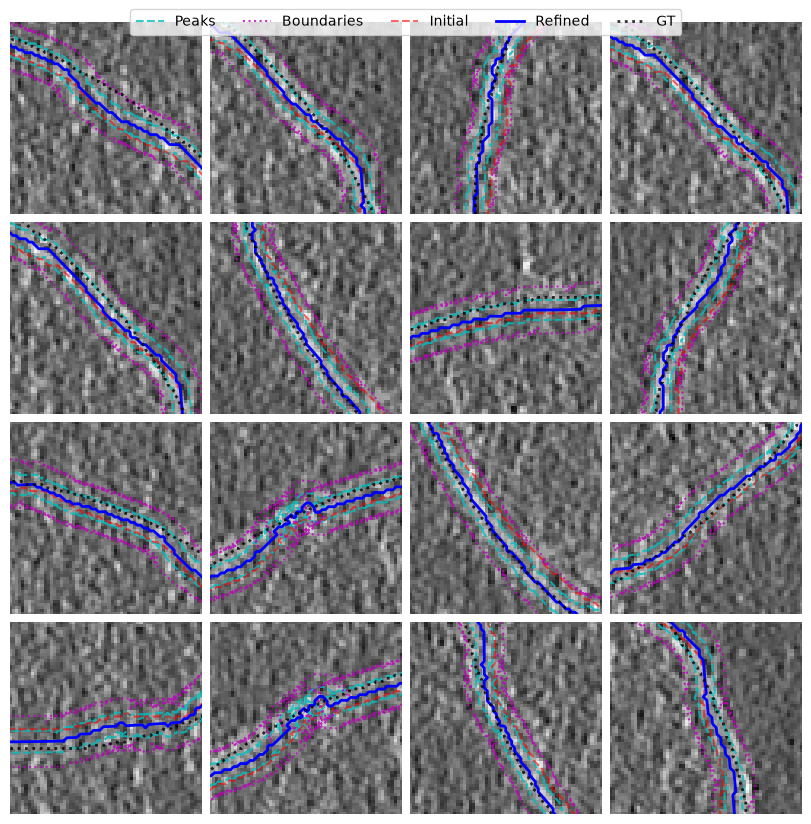

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.591759204864502,
 'data_loss': 0.6335208415985107,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 1.983836054801941,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.01965705305337906,
 'shape_loss': 0.041761647909879684,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 5.218290084485488e-07,
 'smooth_sigma_loss': 0.002227719873189926,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 1999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.6554061770439148}


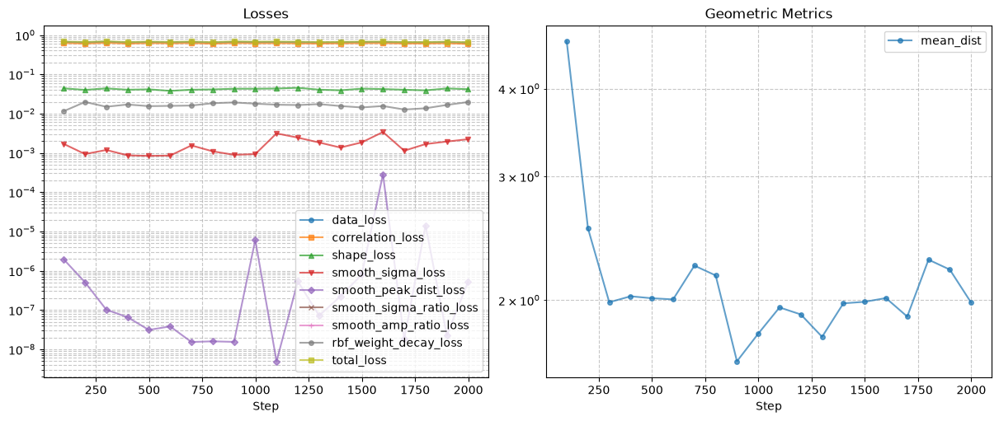

Chamfer from init 3.1248974800109863
Mean Peak Dist: 5.82, Mean Sigma1: 1.94, Mean Sigma2: 1.94
Original Peak Dist: 4.0 Original Sigma1: 0.75


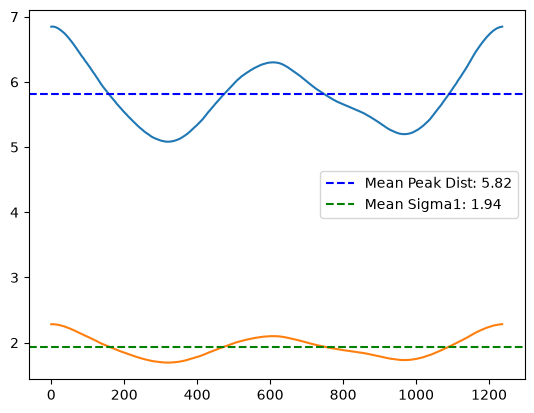

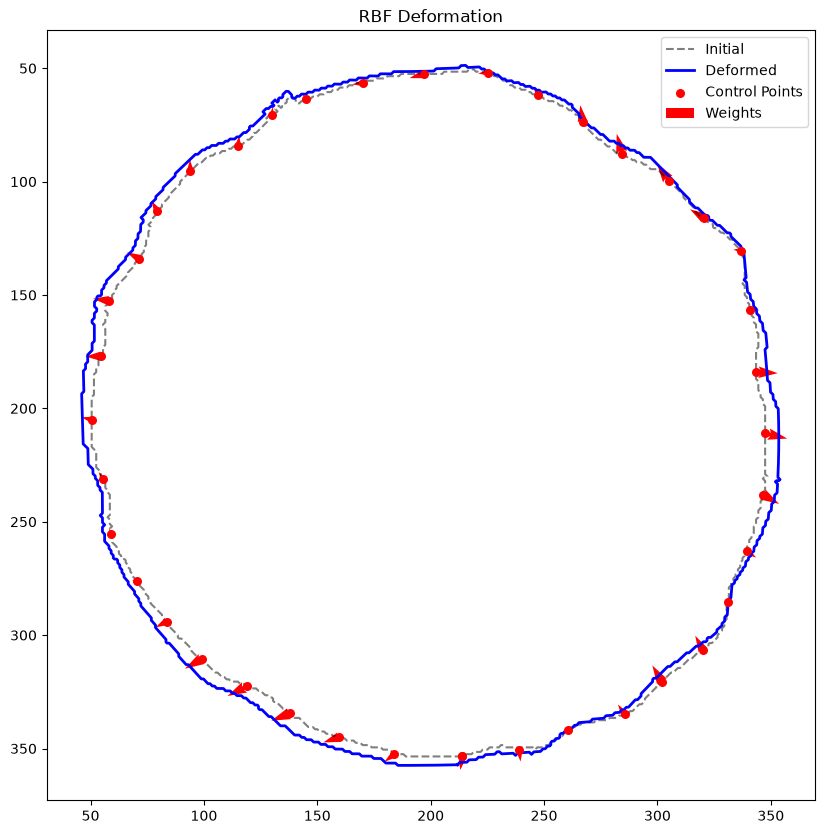

THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporarily using L2 norm for averaging template profiles for visualization.
THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporary setting for profile norm calculations. Not sure how it works with L1 vs L2.


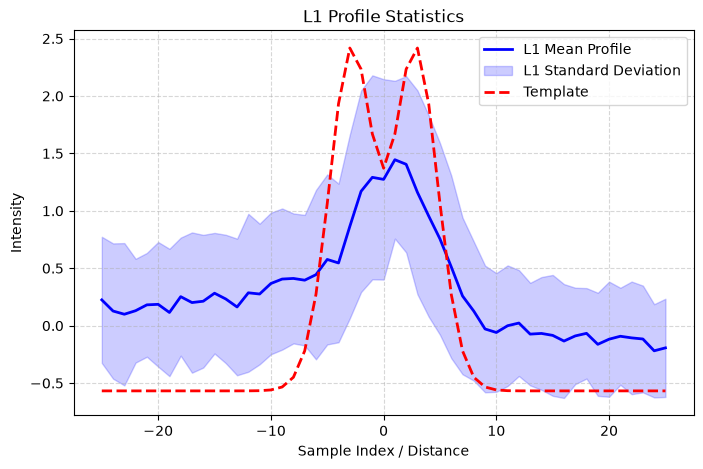

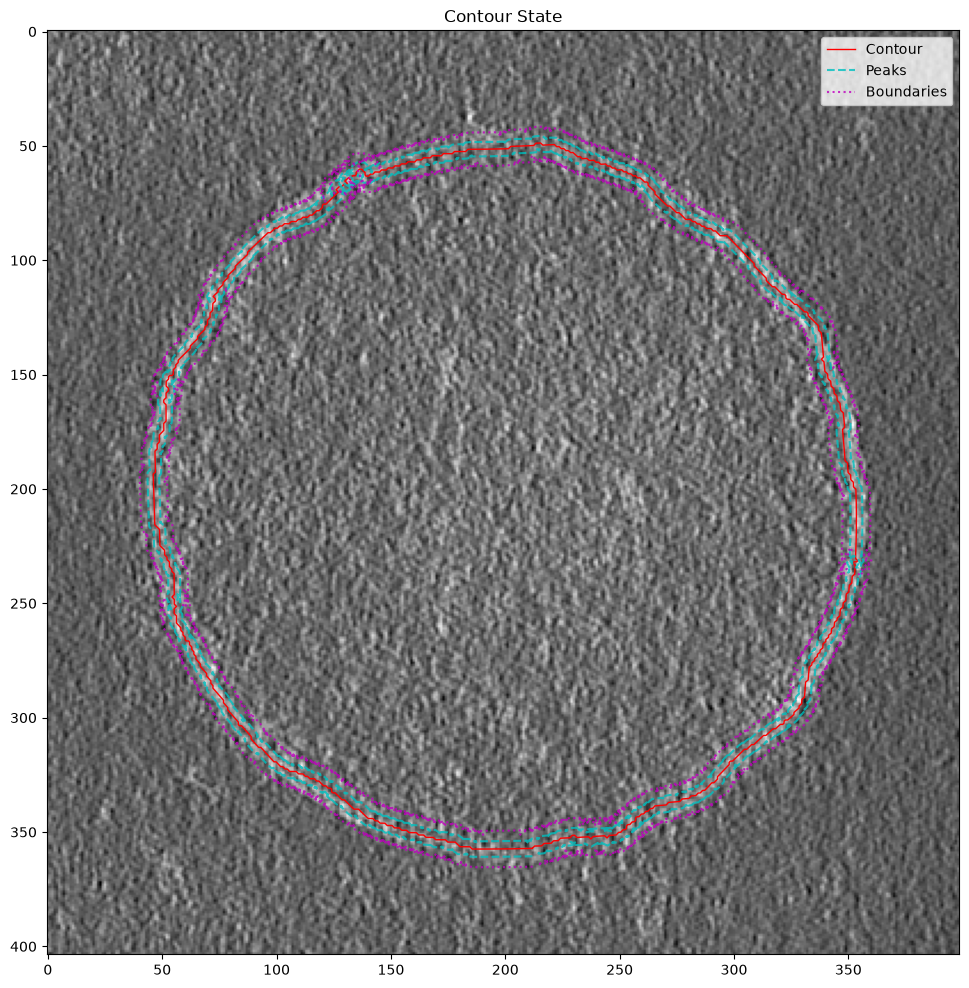

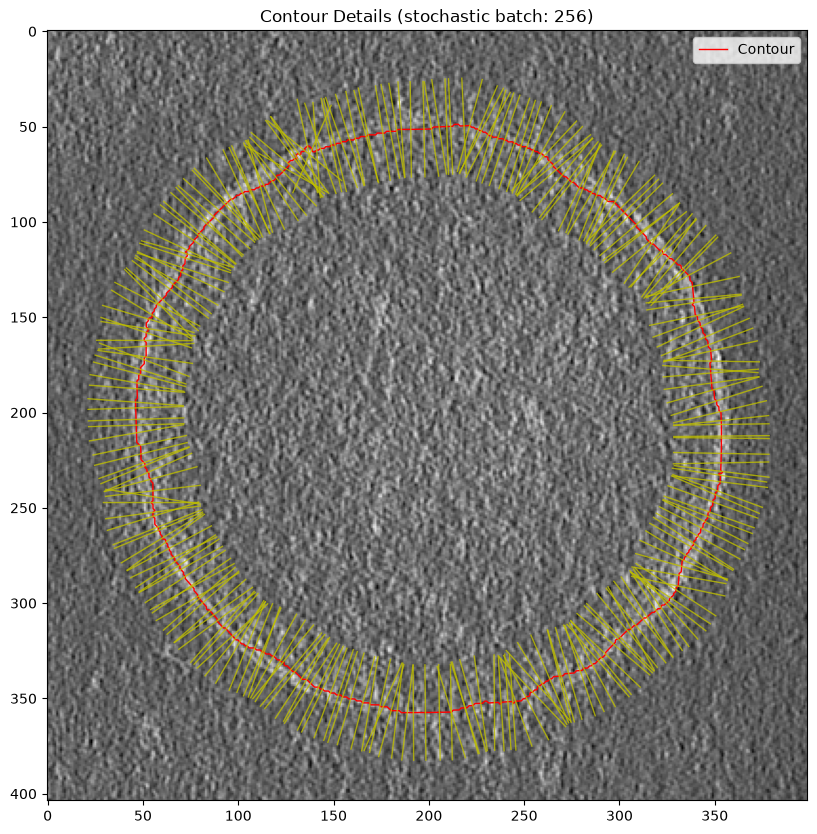

In [984]:
generator = debug.get_generator(device=device, manual_seed=145, reset=True)
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "rbf",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0.0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.1,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 5e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
    "rbf_sigma": 0.0,
}


(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_40_no_regs_2")
trainer.fit(2000)
cb = next(
    (c for c in trainer.trainer.callbacks if isinstance(c, trainer_module.ImageLoggerCallback)),
    None,
)
if cb:
    fig = cb.create_figure(trainer.model)
# trainer.plot_image()
plt.show()

pprint(trainer.trainer.logger.history[-1])
fig = trainer.plot_metrics()
display(fig)
plt.show()
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist, color="b", linestyle="dashed", label=f"Mean Peak Dist: {mean_peak_dist:.2f}"
)
plt.axhline(y=mean_sigma1, color="g", linestyle="dashed", label=f"Mean Sigma1: {mean_sigma1:.2f}")
plt.legend()
plt.show()


trainer.refiner.visualize_rbf_field()
plt.show()

tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

In [985]:
### Result: Seems more robust than bspline, but still not the best. The fit is too flexible and may be overfitting to noise.

### Trying the neural field template model for fun

2026-07-20 16:54:06,595 - INFO - Resetting generator.
2026-07-20 16:54:06,597 - INFO - Creating new generator with seed 12345 on device cpu.
2026-07-20 16:54:06,599 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-20 16:54:06,601 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'rbf_sigma', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-20 16:54:06,602 - INFO - Unused params: []
2026-07-20 16:54:06,606 - INFO - Creating template model: neural
2026-07-20 16:54:06,608 - INFO - Initializing ContourLoss
2026-07-20 16:54:06,610 - INFO - Auto-configured RBF sigma: 44.23 (avg spacing: 22.11)
/Users/saugat/code/diffmeshopt/diffmeshopt/opt2d/refiner.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detac

Default params:
RBFContourRefinerProps(num_steps=2000,
                       learning_rate=0.01,
                       initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                       'anchor_sigma_ratio': 0.0,
                                                       'contour_anchor': 0.0,
                                                       'contour_laplacian': 0.0,
                                                       'edge_length': 0.0,
                                                       'normal_consistency': 0.0,
                                                       'smooth_amp_ratio': 0.5,
                                                       'smooth_peak_dist': 0.5,
                                                       'smooth_sigma': 0.5,
                                                       'smooth_sigma_ratio': 0.5,
                                                       'tangential_laplacian': 0},
                       

2026-07-20 16:54:53,582 - INFO - Final state saved to ../output/verification_test_5A/rbf/cp_40_no_regs_neural/2026-07-20_16-54-06/final.pkl


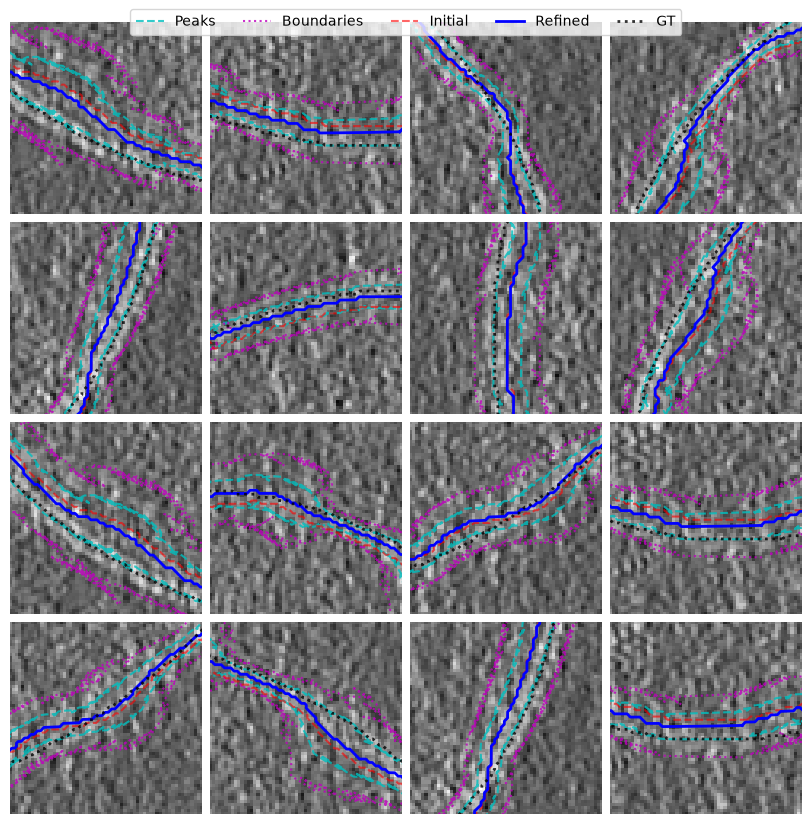

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.6299788951873779,
 'data_loss': 0.6783910989761353,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 3.4444468021392822,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.004495594184845686,
 'shape_loss': 0.04841221123933792,
 'smooth_amp_ratio_loss': 0.0,
 'smooth_peak_dist_loss': 0.0,
 'smooth_sigma_loss': 0.0,
 'smooth_sigma_ratio_loss': 0.0,
 'step': 9999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.6828867197036743}
Chamfer from init 1.475956678390503
Mean Peak Dist: 8.15, Mean Sigma1: 2.72, Mean Sigma2: 2.72
Original Peak Dist: 4.0 Original Sigma1: 0.75


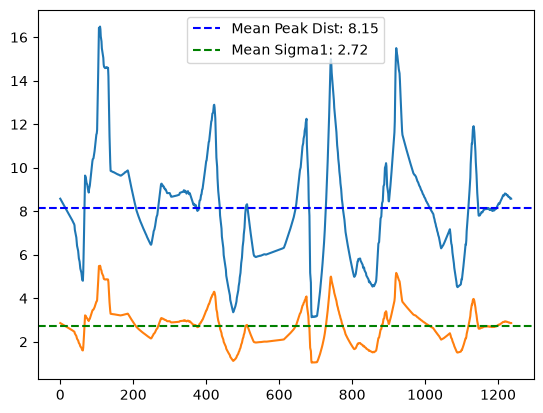

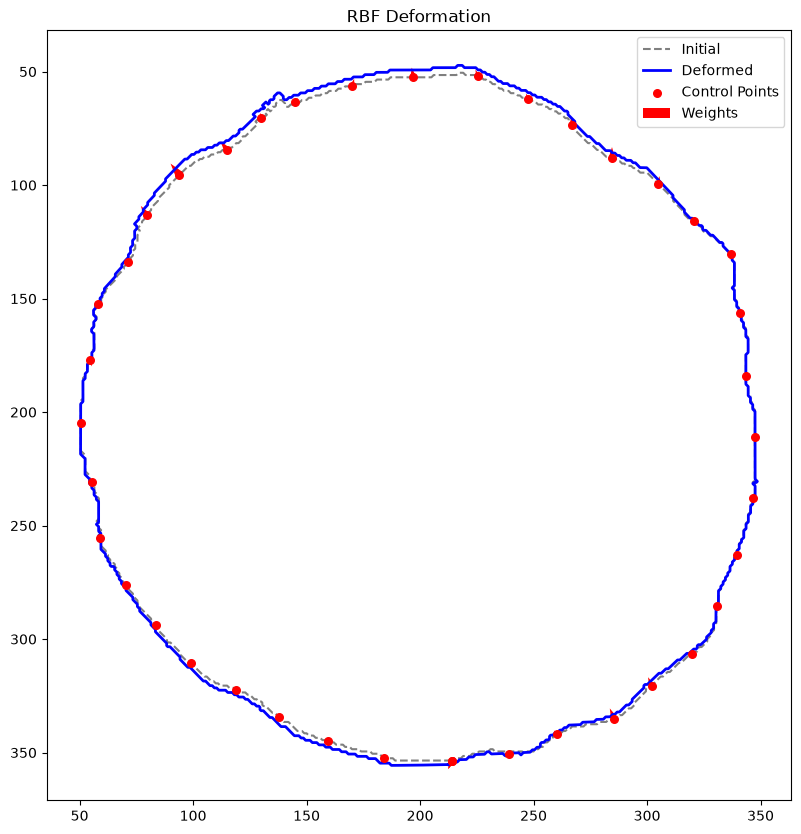

THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporarily using L2 norm for averaging template profiles for visualization.
THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporary setting for profile norm calculations. Not sure how it works with L1 vs L2.


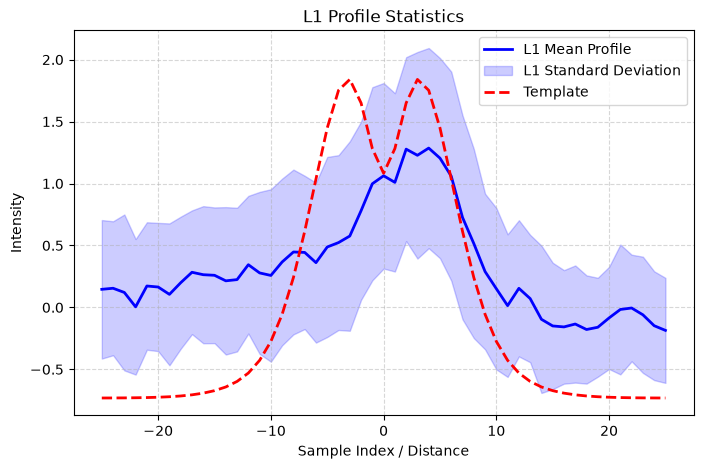

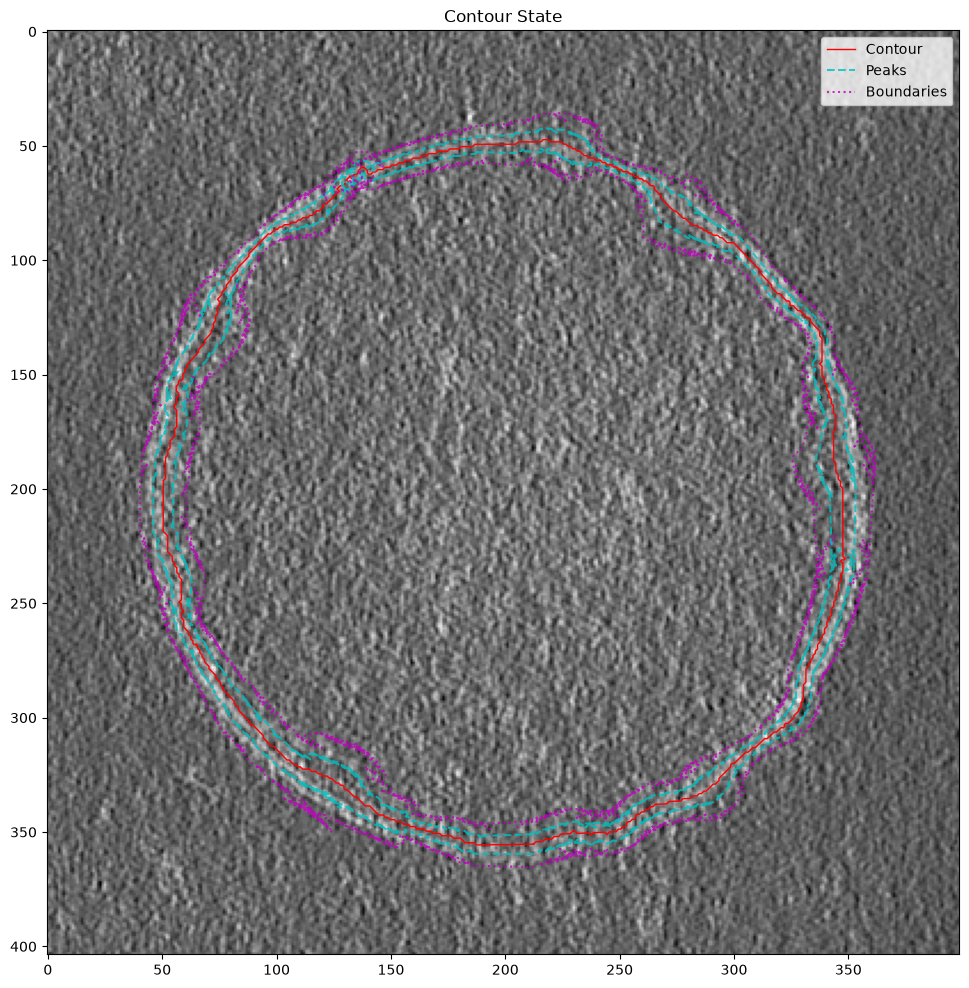

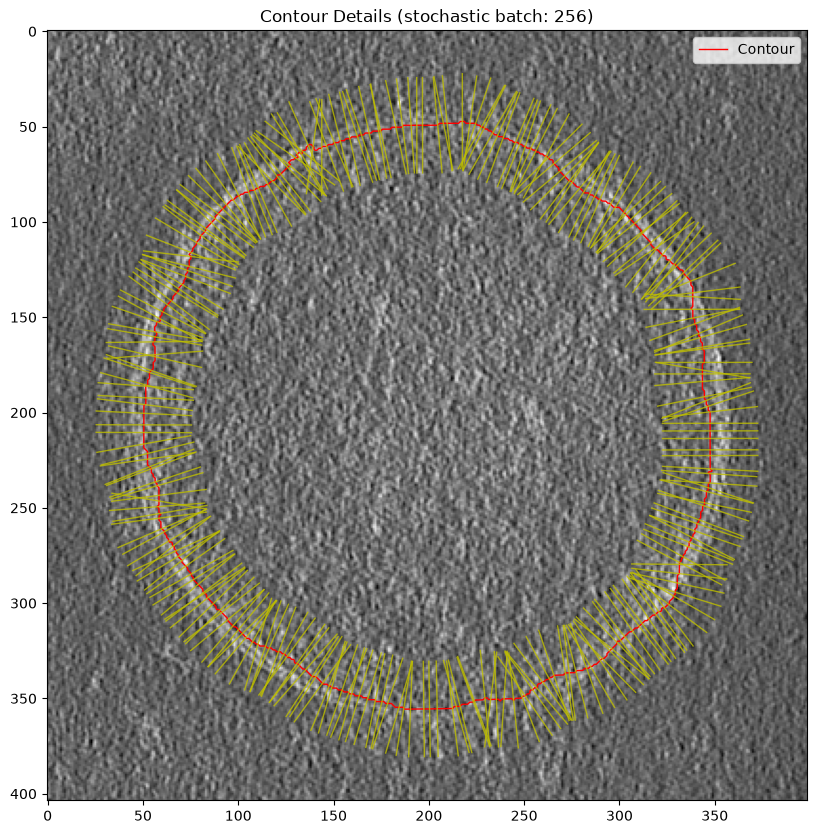

In [987]:
generator = debug.get_generator(device=device, manual_seed=12345, reset=True)
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "rbf",
    "template": "neural",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0.0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.5,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 1e-2,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
    "rbf_sigma": 0.0,
}


(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(props_dict=props_dict, output_subdir_name="cp_40_no_regs_neural")
trainer.fit(10000)
cb = next(
    (c for c in trainer.trainer.callbacks if isinstance(c, trainer_module.ImageLoggerCallback)),
    None,
)
if cb:
    fig = cb.create_figure(trainer.model)
# trainer.plot_image()
plt.show()

pprint(trainer.trainer.logger.history[-1])
trainer.plot_metrics()
plt.show()
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist, color="b", linestyle="dashed", label=f"Mean Peak Dist: {mean_peak_dist:.2f}"
)
plt.axhline(y=mean_sigma1, color="g", linestyle="dashed", label=f"Mean Sigma1: {mean_sigma1:.2f}")
plt.legend()
plt.show()

trainer.refiner.visualize_rbf_field()
plt.show()

tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

### Doesn't work very well. The template variation is too high even with the smoothing. Maybe the best way to do this would be to use a 1D neural templates, but that is basically the same as using a b-spline?

#### Trying out bspline with asymmetric peaks

2026-07-20 16:56:20,255 - INFO - Resetting generator.
2026-07-20 16:56:20,256 - INFO - Creating new generator with seed 12345 on device cpu.
2026-07-20 16:56:20,258 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-20 16:56:20,259 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'rbf_sigma', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-20 16:56:20,260 - INFO - Unused params: []
2026-07-20 16:56:20,263 - INFO - Creating template model: bspline
2026-07-20 16:56:20,264 - INFO - Initializing ContourLoss
2026-07-20 16:56:20,265 - INFO - Auto-configured RBF sigma: 44.23 (avg spacing: 22.11)
2026-07-20 16:56:20,267 - INFO - Auto-configured RBF weight decay: 0.1333 (target_disp=5.0px, sigma=0.75)
2026-07-20 16:56:20,268 - INFO - Output directory set to: ../output/verificatio

Default params:
RBFContourRefinerProps(num_steps=2000,
                       learning_rate=0.5,
                       initial_regularization_weights={'anchor_amp_ratio': 0.0,
                                                       'anchor_sigma_ratio': 0.0,
                                                       'contour_anchor': 0.0,
                                                       'contour_laplacian': 0.0,
                                                       'edge_length': 0.0,
                                                       'normal_consistency': 0.0,
                                                       'smooth_amp_ratio': 0.1,
                                                       'smooth_peak_dist': 0.1,
                                                       'smooth_sigma': 0.1,
                                                       'smooth_sigma_ratio': 0.1,
                                                       'tangential_laplacian': 0},
                       p

2026-07-20 16:56:45,153 - INFO - Final state saved to ../output/verification_test_5A/rbf/cp_40_no_regs_asymmetric/2026-07-20_16-56-20/final.pkl


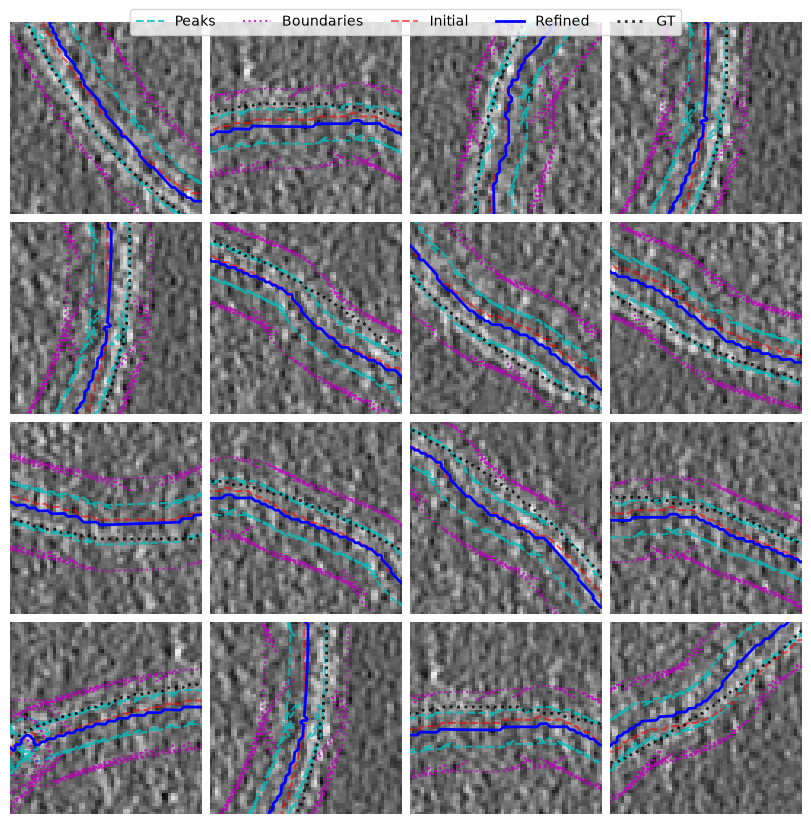

{'anchor_amp_ratio_loss': 0.0,
 'anchor_peak_dist_loss': 0.0,
 'anchor_sigma_loss': 0.0,
 'anchor_sigma_ratio_loss': 0.0,
 'contour_anchor_loss': 0.0,
 'contour_laplacian_loss': 0.0,
 'correlation_loss': 0.6107234954833984,
 'data_loss': 0.6408807635307312,
 'edge_length_loss': 0.0,
 'epoch': 0,
 'mean_dist': 5.3507795333862305,
 'normal_consistency_loss': 0.0,
 'rbf_weight_decay_loss': 0.01099648792296648,
 'shape_loss': 0.030157292261719704,
 'smooth_amp_ratio_loss': 0.0002391500456724316,
 'smooth_peak_dist_loss': 2.0532346933777035e-09,
 'smooth_sigma_loss': 0.0007104585529305041,
 'smooth_sigma_ratio_loss': 0.00030946588958613575,
 'step': 4999,
 'tangential_laplacian_loss': 0.0,
 'total_loss': 0.6531363129615784}
Chamfer from init 1.6512956619262695
Mean Peak Dist: 11.37, Mean Sigma1: 4.05, Mean Sigma2: 3.53
Original Peak Dist: 4.0 Original Sigma1: 0.75


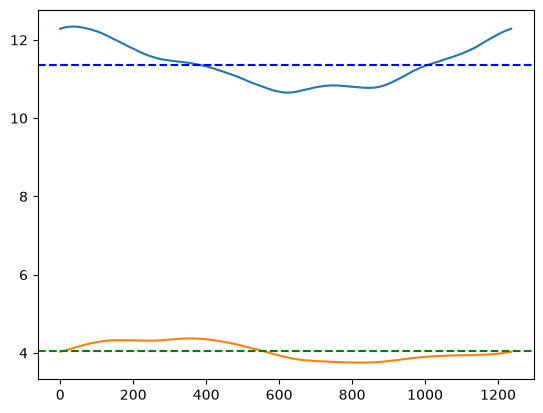

THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporarily using L2 norm for averaging template profiles for visualization.
THIS IS A DEBUG SETTING AND NEEDS TO BE CHANGED. Context:
Temporary setting for profile norm calculations. Not sure how it works with L1 vs L2.


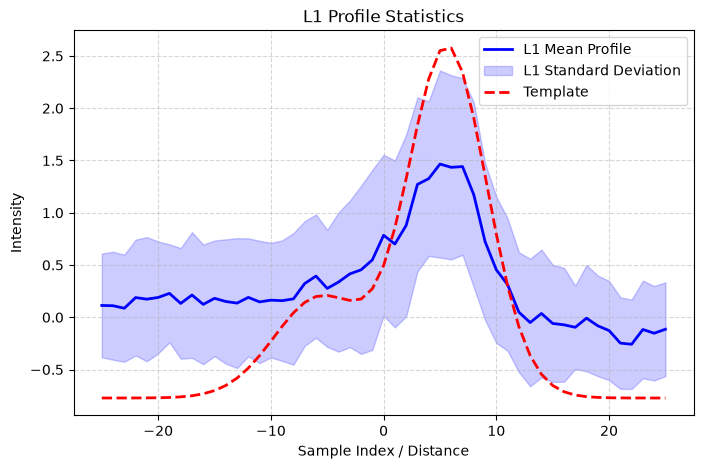

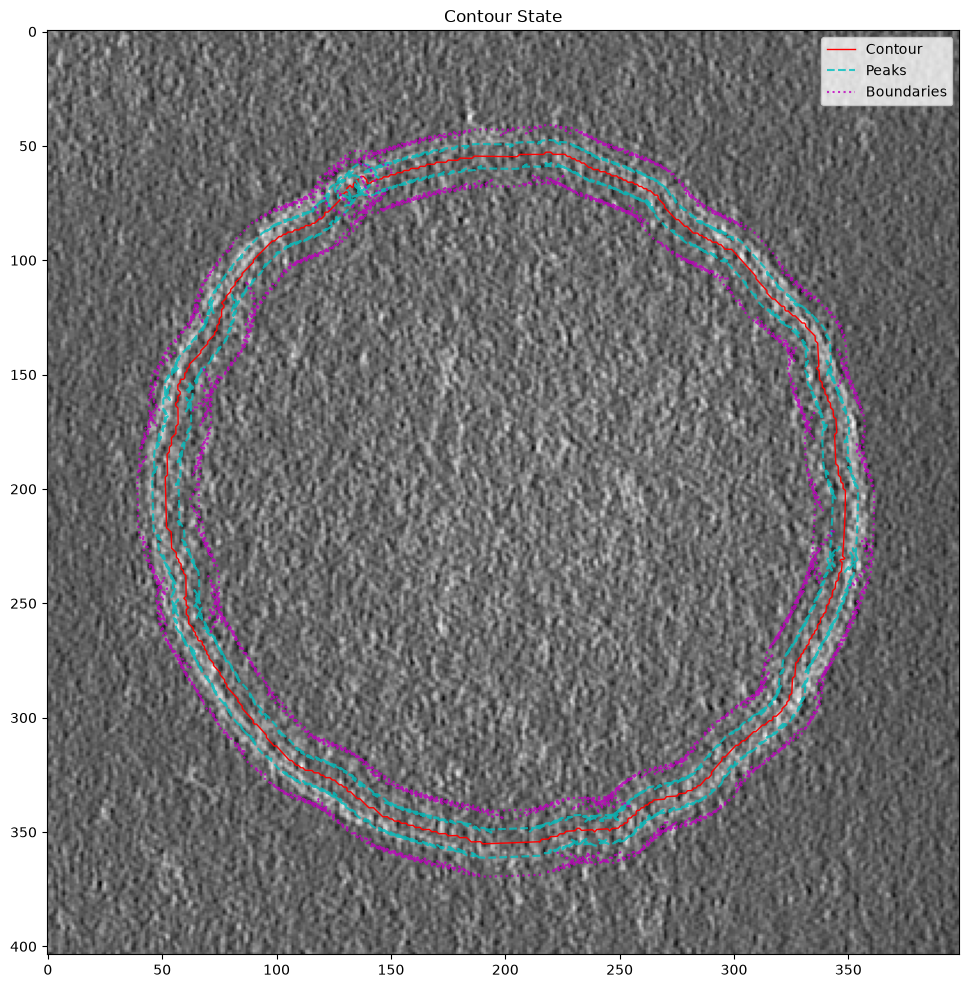

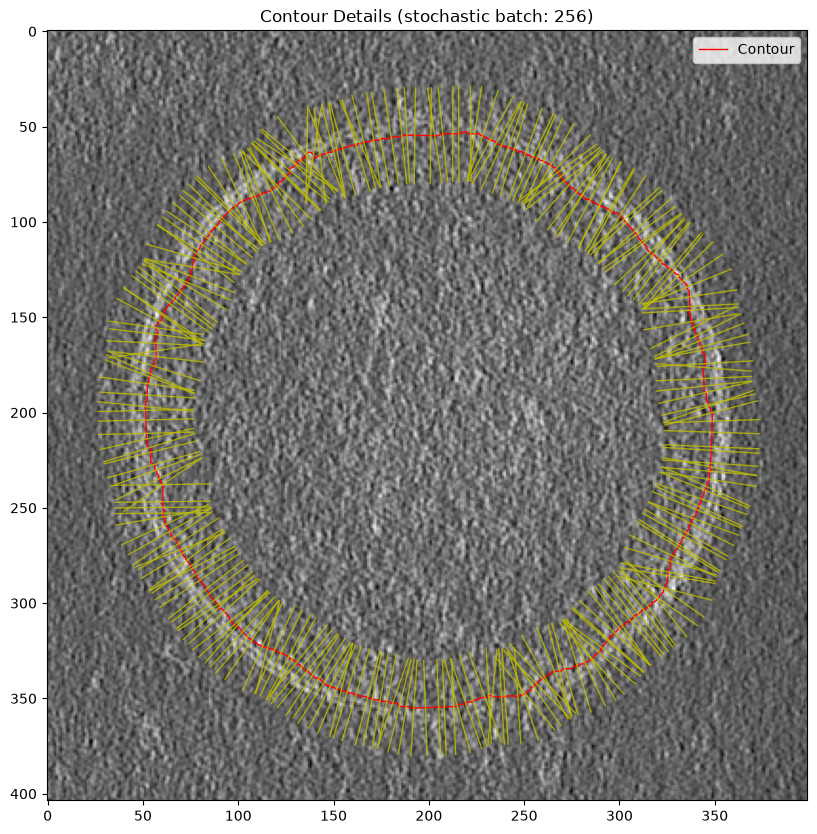

In [989]:
generator = debug.get_generator(device=device, manual_seed=12345, reset=True)
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "rbf",
    "template": "bspline",
    "symmetric": False,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0.0,
    "w_tangential": 0,
    "w_anchor": 0.0,
    "w_smooth_param": 0.1,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 5e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
    "rbf_sigma": 0.0,
}


(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(
    props_dict=props_dict, output_subdir_name="cp_40_no_regs_asymmetric"
)
trainer.fit(5000)
cb = next(
    (c for c in trainer.trainer.callbacks if isinstance(c, trainer_module.ImageLoggerCallback)),
    None,
)
if cb:
    fig = cb.create_figure(trainer.model)
# trainer.plot_image()
plt.show()

pprint(trainer.trainer.logger.history[-1])
trainer.plot_metrics()
plt.show()
# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

In [771]:
### Result: Asymmetric is very bad. The sigma ratio probably needs to be tuned better.

#### Trying out bspline with strong template anchors

In [14]:
generator = debug.get_generator(device=device, manual_seed=12345, reset=True)
props_dict = {
    "trial_id": "verify_5A",
    "refiner": "rbf",
    "template": "bspline",
    "symmetric": True,
    "reg_mode": "static",
    "w_laplacian": 0.0,
    "w_edge": 0.0,
    "w_normal": 0.0,
    "w_tangential": 0,
    "w_anchor": 1.0,
    "w_smooth_param": 0.1,
    "w_contour_anchor": 0.0,
    "shape_loss_weight": 0.1,
    "learning_rate": 5e-1,
    "smoothness_window_size": 5,
    "min_peak_ratio": 3.0,
    "num_cp": 40,
    "rbf_sigma": 0.0,
}


(
    trainer,
    run_dir,
    refiner_props,
    template_props,
    t_mode,
    image,
    init_contour,
    gt_contour,
    image_t,
    contour_t,
    gt_contour_t,
) = create_trainer_with_config(
    props_dict=props_dict, output_subdir_name="cp_40_no_regs_asymmetric"
)
trainer.fit(5000)
display(trainer.plot_image())

pprint(trainer.trainer.logger.history[-1])
display(trainer.plot_metrics())

# Evaluate
final_contour = trainer.refiner.contour.detach().cpu().numpy()

# Check for NaNs or explosion
if np.isnan(final_contour).any() or np.max(np.abs(final_contour)) > max(image.shape) * 2:
    chamfer = np.inf


metrics_from_init = hps.compute_contour_metrics(trainer.refiner.contour, contour_t)
chamfer_from_init = metrics_from_init["mean_dist"]
print("Chamfer from init", chamfer_from_init)
tmp_coords = trainer.refiner.contour
tmp_coords = tmp_coords.detach().cpu()
template_params = trainer.refiner.template_model.get_params(coordinates=tmp_coords)
(
    template_params["peak_dist"].mean(),
    template_params["peak_dist"].std(),
    template_params["sigma1"].mean(),
    template_params["sigma1"].std(),
)

mean_peak_dist = template_params["peak_dist"].detach().numpy().mean()
mean_sigma1 = template_params["sigma1"].detach().numpy().mean()
mean_sigma2 = template_params["sigma2"].detach().numpy().mean()

print(
    f"Mean Peak Dist: {mean_peak_dist:.2f}, Mean Sigma1: {mean_sigma1:.2f}, Mean Sigma2: {mean_sigma2:.2f}"
)
print(f"Original Peak Dist: {template_props.peak_dist} Original Sigma1: {template_props.sigma}")

plt.plot(template_params["peak_dist"].detach().numpy())
plt.plot(template_params["sigma1"].detach().numpy())
plt.axhline(
    y=mean_peak_dist,
    color="b",
    linestyle="dashed",
)
plt.axhline(
    y=mean_sigma1,
    color="g",
    linestyle="dashed",
)
plt.show()
tmp_profiles, *_ = trainer.refiner.sample_image_features(image_t)
tmp_profiles = tmp_profiles.detach()
trainer.refiner.visualize_profile_statistics(image_t.cpu())
plt.show()
trainer.refiner.visualize_contour(image_t.detach())
vis.plot_contour_normals(image_t, tmp_coords.detach().numpy())
plt.show()

2026-07-22 14:37:38,536 - INFO - Resetting generator.
2026-07-22 14:37:38,537 - INFO - Creating new generator with seed 12345 on device cpu.
2026-07-22 14:37:38,538 - INFO - Loading dataset from ../data/2d_training_data_perturbations.pkl
2026-07-22 14:37:38,539 - INFO - Used params: ['learning_rate', 'min_peak_ratio', 'num_cp', 'rbf_sigma', 'refiner', 'reg_mode', 'shape_loss_weight', 'smoothness_window_size', 'symmetric', 'template', 'trial_id', 'w_anchor', 'w_contour_anchor', 'w_edge', 'w_laplacian', 'w_normal', 'w_smooth_param', 'w_tangential']
2026-07-22 14:37:38,540 - INFO - Unused params: []
2026-07-22 14:37:38,542 - INFO - Creating template model: bspline


Default params:
RBFContourRefinerProps(num_steps=2000,
                       learning_rate=0.5,
                       data_loss_type=<DataLossType.BIGAUSSIAN_CORRELATION: 'bigaussian_correlation'>,
                       initial_regularization_weights={'anchor_amp_ratio': 1.0,
                                                       'anchor_sigma_ratio': 1.0,
                                                       'contour_anchor': 0.0,
                                                       'contour_laplacian': 0.0,
                                                       'edge_length': 0.0,
                                                       'normal_consistency': 0.0,
                                                       'smooth_amp_ratio': 0.1,
                                                       'smooth_peak_dist': 0.1,
                                                       'smooth_sigma': 0.1,
                                                       'smooth_sigma_ratio': 0.1,
    

ValueError: RegularizerDefaults has configs for unknown regularizers: ['smooth_peak_dist', 'smooth_sigma_ratio', 'anchor_sigma_ratio', 'tangential_laplacian', 'contour_laplacian', 'smooth_amp_ratio', 'smooth_sigma', 'edge_length', 'normal_consistency', 'anchor_amp_ratio', 'contour_anchor']. Either add to RegularizerType enum or remove from dict.

In [12]:
### Result: Even now the peak distance and the sigma are both too high. They are not fitting properly to the bigaussian profile.